In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation
from IPython.display import HTML
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
plt.style.use(["science", "notebook", "grid"])

## Random walk in 3D

In [2]:
def Random_walk3D(n_walkers, n_steps, horizontal_step, vertical_step, forward_step):
    """Generate random steps in 3D space.
    Parameters
    ----------
    n_walkers : int
    n_steps : int
        Number of steps to generate.
    horizontal_step : float
        Maximum horizontal step size.
    vertical_step : float
        Maximum vertical step size.
    forward_step : float
        Maximum forward step size.
    Returns
    -------
    steps : (n_steps, 3) array
        Array of steps.
    """
    steps = np.zeros((n_walkers, n_steps, 3))
    
    # Generate random steps.
    steps[:, :, 0] = np.random.choice([-horizontal_step, 0, horizontal_step], (n_walkers, n_steps))
    steps[:, :, 1] = np.random.choice([-vertical_step, 0, vertical_step], (n_walkers, n_steps))
    steps[:, :, 2] = np.random.choice([-forward_step, 0, forward_step], (n_walkers, n_steps))
    return np.cumsum(steps, axis=1)

In [3]:
N_STEPS = 1000
N_WALKERS = 100
HORIZONTAL_STEP = .1
VERTICAL_STEP = .1
FORWARD_STEP = .1

steps = Random_walk3D(N_WALKERS, N_STEPS, HORIZONTAL_STEP, VERTICAL_STEP, FORWARD_STEP)
# in order of walkers, steps, and x, y, z

# Plotting the 3 dimensional random walk

In [4]:
# Plot the 3D random walk.
fig = px.line_3d(x=steps[0, :, 0].T, y=steps[0, :, 1].T, z=steps[0, :, 2].T, width=1200, height=1000 ,
                 title=f'3D Random Walk ({N_STEPS} steps and {N_WALKERS} walkers)')

for walker in range(1, N_WALKERS):
    fig.add_scatter3d(x=steps[walker, :, 0].T, y=steps[walker, :, 1].T, z=steps[walker, :, 2].T, 
                      marker=dict(size=.1),
                      line=dict(width=2), name=f'Walker {walker}')
fig.add_scatter3d(x=[0], y=[0], z=[0], mode='markers', marker=dict(size=10, color='red'), name = "Origin")
fig



MovieWriter imagemagick unavailable; using Pillow instead.


KeyboardInterrupt: 

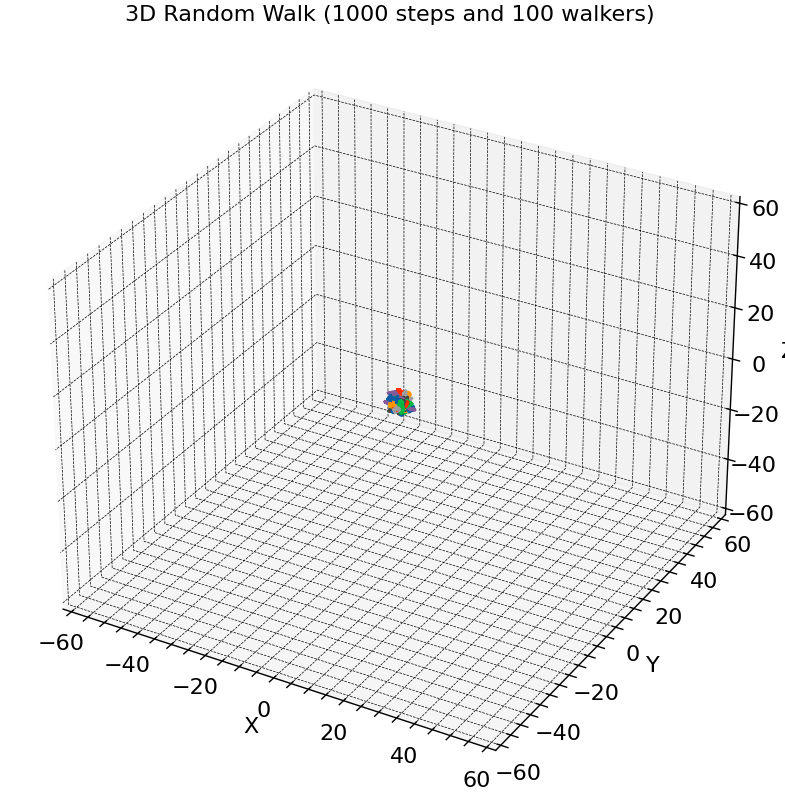

In [5]:
# Animation of the 3D random walk.
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
# ax.set_xlim(-N_STEPS, N_STEPS)
# ax.set_ylim(-N_STEPS, N_STEPS)
# ax.set_zlim(-N_STEPS, N_STEPS)
ax.set_xlim(-60, 60)
ax.set_ylim(-60, 60)
ax.set_zlim(-60, 60)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

ax.title.set_text(f'3D Random Walk ({N_STEPS} steps and {N_WALKERS} walkers)')

lines = [ax.plot([], [], [], lw=2)[0] for _ in range(N_WALKERS)]

def init():
    for line in lines:
        line.set_data([], [])
        line.set_3d_properties([])
    return lines

def animate(i):
    for walker, line in enumerate(lines):
        line.set_data(steps[walker, :i, 0], steps[walker, :i, 1])
        line.set_3d_properties(steps[walker, :i, 2])
    return lines


anim = animation.FuncAnimation(fig, animate, init_func=init,
                                 frames=1000, interval=30, blit=True)
anim.save('random_walk3D.gif', writer='imagemagick', fps=30)

In [ ]:
# Distances of the walkers from the origin.
distances = np.sqrt(np.sum(steps[:, :, :]**2, axis=2))

# Plot the distances.
fig = px.line(x=np.arange(N_STEPS), y=distances[0, :], width=1200, height=1000,
                title=f'Distance from origin ({N_STEPS} steps and {N_WALKERS} walkers)')
for walker in range(1, N_WALKERS):
    fig.add_scatter(x=np.arange(N_STEPS), y=distances[walker, :], name=f'Walker {walker}')
fig

In [ ]:
def HasReachedOrigin(distances, tolerance=0.1):
    """Check if the walkers have reached the origin.
    Parameters
    ----------
    distances : (n_walkers, n_steps) array
        Array of distances from the origin.
    tolerance : float
        Tolerance for the distance from the origin.
    Returns
    -------
    reached_origin : (n_walkers, n_steps) array
        Array of booleans indicating if the walkers have reached the origin.
    """
    bools = np.any(distances < tolerance, axis=1)
    unique, counts = np.unique(bools, return_counts=True)
    return dict(zip(unique, counts))

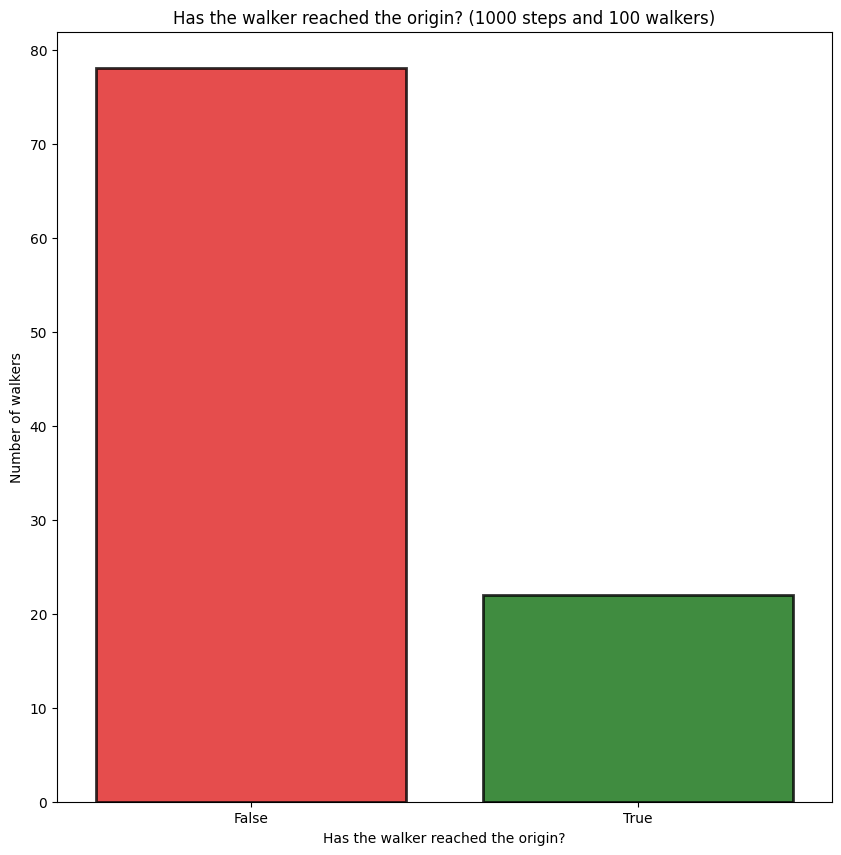

In [ ]:
plt.figure(figsize=(10, 10))
sns.barplot(x=list(HasReachedOrigin(distances).keys()), y=list(HasReachedOrigin(distances).values()),
            palette=['red', 'green'], alpha=0.8, edgecolor='black', linewidth=2)
plt.title(f'Has the walker reached the origin? ({N_STEPS} steps and {N_WALKERS} walkers)')
plt.xlabel('Has the walker reached the origin?')
plt.ylabel('Number of walkers')
plt.show()